IMPORTANT NOTE:
This script was build in the purpose of presenting the **final** Heatmap of the markers of the selected K of kmeans.
if you want to use it generally you actually can by removing only one block (written down) that fixes the empty clusters and remove them. that block is adjusted to work only for k=15 (the selected one).

In [1]:
lib = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/'
import sys
sys.path.append(lib)
from utilities.package_importing import *

# from os.path import join
# import numpy as np
# import pandas as pd
# import scipy
# import sklearn
# from sklearn.manifold import TSNE
# import pickle
# # from Bio.Cluster import kcluster
# import os
# import numpy as np
# import yaml
# import os
# import pandas
# from collections import Counter
# from sklearn.cluster import KMeans
# import matplotlib.pyplot as plt
# # from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
# import sys
# import seaborn as sns
# # import pyclustering
# import matplotlib.pyplot as plt
# # import matplotlib
# import seaborn as sb
# from shutil import copyfile
# # import matplotlib as plt
# # ------- SERVER EXTENSIONS ---------
# lib =  r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/utilities/droplet_dataset'
# lib2 = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/utilities'
# lib3 = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/data_analysis'
# lib4 = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy'
# lib5 = r'/srv01/technion/shitay/Code/classifying_response_to_immunotherapy/scripts'
# import sys
# sys.path.append(lib)
# sys.path.append(lib2)
# sys.path.append(lib3)
# sys.path.append(lib4)
# sys.path.append(lib5)
# # ------- SERVER EXTENSIONS ---------
# from utilities.general_helpers import create_folder
# plt.rcParams['figure.dpi'] = 1000


##### Specify:
1. row_kmeans path

2. path of cohort which used

3. clustering_analysis path

In [28]:
# OUTPUT_PATH = r'/storage/md_keren/shitay/outputs/clustering/heatmap/26.6.21'
FILTERED_CELLS_PATH = r'/storage/md_keren/shitay/Data/droplet_seq/M97_M173/subcohort/normalized/1.1.22/subcohort_immune_cells_normalized_1.1.22_protein_coding_genes.pkl'
SUBSET = 'MYELOIDS'    # None - all cells, MYELOIDS/CYTOTOXIC_T_CELLS

KMEANS_ROW_CLUSTERS_PATH = fr'/storage/md_keren/shitay/outputs/clustering/myeloid/kmeans/subcohort_1.1.22_run_1.1.22/row_kmeans'
KMEANS_FILE_NAME = r'kmeans_immune_cells_4k_genes'  # excluding the suffix: '_k_num.pkl'

#### if built in finalize_cluster.ipynb CLUSTERING_ANALYSIS_PATH should be path of the summary folder)
CLUSTERING_ANALYSIS_PATH = fr'/storage/md_keren/shitay/outputs/clustering/myeloid/summary/subcohort_1.1.22_run_1.1.22'

##### Loads cohort (and cmap a file for barcolor of heatmap)

In [29]:
filtered_cells = pickle.load(open(FILTERED_CELLS_PATH, 'rb'))
if SUBSET:
    filtered_cells = get_requested_subset(filtered_cells, SUBSET)

cmap = pickle.load(open(r'/storage/md_keren/shitay/outputs/clustering/immune/heatmap/colorbar.pkl', 'rb'))

Will be performed on myeloids
IMMUNE CLUSTERING in path 	 /storage/md_keren/shitay/outputs/clustering/immune/summary/4.11.21/immune_kmeans_integrated_4.11.21_clusters_mapping.csv 	 is used for defining which cells are myeloids
Cluster 5 is defined to be myeloids


##### Select K (of kmeans - number of clusters)

In [31]:
K = 9
print(f"Current K = {K}")

Current K = 9


##### Loads marker row file accordingly (if built in finalize_cluster.ipynb CLUSTERING_ANALYSIS_PATH should be path of the summary folder)

In [32]:
# markers
clustering_analysis = pickle.load(open(join(CLUSTERING_ANALYSIS_PATH, f'cluster_analysis_k_{K}.pkl'), 'rb'))

Two options to load clusters indices:

###### Option 1: loads mapping df file - barcodes to clusters (if you built clusters using finalize_clusters)

In [33]:
CSV_PATH = r'/storage/md_keren/shitay/outputs/clustering/myeloid/summary/subcohort_1.1.22_run_1.1.22/subcohort_myeloid_1.1.22_clusters_mapping.csv'

df = pd.read_csv(CSV_PATH)
def get_clusters_indices(df):
    mapping = list(zip(filtered_cells.samples, filtered_cells.barcodes))
    clusters = sorted(set(df['Cluster']))
    clusters_indexes = []
    for cluster_idx in clusters:
        barcodes_list = df[df['Cluster']==cluster_idx]['Barcode'].tolist()
        sample_list = df[df['Cluster']==cluster_idx]['Sample'].tolist()
        cell_idxs = [mapping.index(pair_identifier) for pair_identifier in zip(sample_list, barcodes_list)]
        clusters_indexes.append(cell_idxs)
    return clusters_indexes
clusters_indices = get_clusters_indices(df)

###### Option 2: loads kmeans_row data

In [6]:
kmeans_file_path = join(KMEANS_ROW_CLUSTERS_PATH, KMEANS_FILE_NAME + f'_k_{K}.pkl')
print(f'Loading kmeans file:\n{kmeans_file_path}')
clusters_indices = pickle.load(open(kmeans_file_path, 'rb'))['clusters']

Loading kmeans file:
/storage/md_keren/shitay/outputs/clustering/CD8/kmeans/cohort_26.6.21_run_11.8.21/row_kmeans/kmeans_immune_cells_4k_genes_k_10.pkl


# The next block fixes the markers of K=15, if you want to use this script generally you should just put it in comment

In [42]:
# cluster_should_be_removed = [2, 6, 9, 13]
# for cluster_idx in reversed(cluster_should_be_removed):
#     del clusters_indices[cluster_idx-1]
# for cluster_idx in reversed(cluster_should_be_removed):
#     del clustering_analysis[cluster_idx-1]
    
# k15_cls_15_markers_path = r'/storage/md_keren/shitay/Data/tables/kmeans_clusters_markers_26.6.21/kmeans_26.6.21_k15_cls15_top30_markers.csv'
# clustering_analysis[10]['markers'] = pd.read_csv(k15_cls_15_markers_path)

#### Loops over markers DFs and taks the indexes of marker genes from cohort

In [34]:
NUM_OF_MARKER_GENES = 30

In [35]:
features = filtered_cells.features

print(clustering_analysis[0].keys())
gene_indices = []
gene_horiz_lines = [0]  # for heatmap
cell_vertical_lines = [0]  # for heatmap
top_gene_markers = {}

print('num markers for each cluster: ', NUM_OF_MARKER_GENES)
print('num markers for all clusters: ', NUM_OF_MARKER_GENES * len(clustering_analysis))
print('num clusters: ', len(clustering_analysis))
mapping_clusters_to_marker_indices = {}
for idx, cluster_dic in enumerate(clustering_analysis):
    cluster_idx = cluster_dic['cluster id']
    cluster = cluster_dic['markers']

    cluster = cluster.sort_values(by=['log_FC'], ascending=False)
    gene_ids = cluster['features'].tolist()
    top_gene_marker_names = cluster['gene names'].tolist()
    top_gene_markers[cluster_idx] = cluster['gene names'][:5]
    top_markers_indices = [features.index(ii) for ii in gene_ids[:NUM_OF_MARKER_GENES]]
    mapping_clusters_to_marker_indices[idx] = top_markers_indices
    gene_indices += top_markers_indices
    gene_horiz_lines += [gene_horiz_lines[-1] + len(gene_ids[:NUM_OF_MARKER_GENES])]


print('Num of repetition in markers:', NUM_OF_MARKER_GENES * K - len(set(gene_indices)), end="\n\n")

dict_keys(['cluster id', 'markers'])
num markers for each cluster:  30
num markers for all clusters:  270
num clusters:  9
Num of repetition in markers: 54



In [36]:
# top_gene_markers

# Starts building the heatmap
There are two ways to build it:
1) taking all the cells.
2) take a sample of 100 cells from each cluster.

### Option (1) takes all cells

##### Loops over clusters indexes and builds a list containing the indexes in the right order

In [37]:
cells_indices = []
for cls_idx, cluster_indices in enumerate(clusters_indices):
    print(f'{cls_idx}. num cells: {len(cluster_indices)}')
    top_markers_indices = mapping_clusters_to_marker_indices[cls_idx]
    mean_values = filtered_cells.counts[cluster_indices][:, top_markers_indices].mean(axis=1)
    cluster_indices = np.array(cluster_indices)[np.flip(np.argsort(mean_values))].tolist()
    cells_indices += cluster_indices
    cell_vertical_lines += [cell_vertical_lines[-1] + len(cluster_indices)]

0. num cells: 696
1. num cells: 1514
2. num cells: 362
3. num cells: 829
4. num cells: 738
5. num cells: 863
6. num cells: 488
7. num cells: 924
8. num cells: 1231


#### Gets heatmap values by giving indices of cells and indices of gene markers.

In [38]:
arr_heatmap = filtered_cells.counts[cells_indices][:, gene_indices]
heatmap = np.zeros_like(arr_heatmap)
heatmap[arr_heatmap > 1] = 1

## 19.3.21 using zscore
arr_heatmap = scipy.stats.zscore(arr_heatmap, axis=0, ddof=1)

#### Draws heatmap

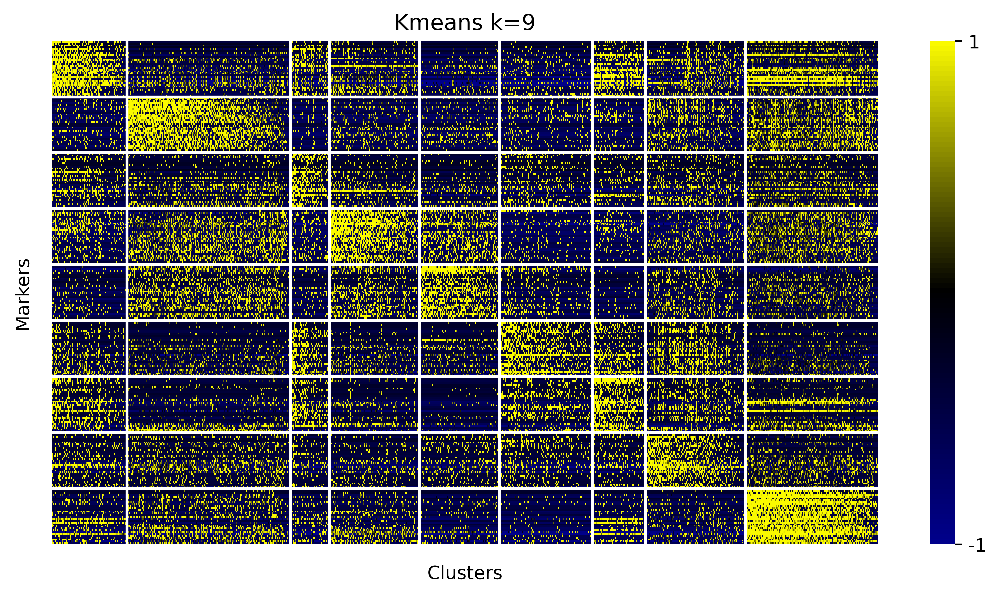

In [39]:
fig, ax = plt.subplots(1)
fig.set_size_inches(10, 5)

sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
cbar = sb_out.collections[0].colorbar
cbar.set_ticks([-1, 1])
cbar.set_ticklabels([-1, 1])
sb_out.set(xticklabels=[])
sb_out.set(yticklabels=[])
sb_out.tick_params(bottom=False, left=False)
for hor_line in gene_horiz_lines[1:-1]:
    ax.axhline(hor_line, color='white')

for ver_line in cell_vertical_lines[1:-1]:
    ax.axvline(ver_line, color='white')

ax.set_title(f"Kmeans k={K}");
ax.set_xlabel('Clusters');
ax.set_ylabel('Markers');

### Option (2) takes a sample of 100 cells from each cluster. DO NOT run it if you decided on running option (1) here above.


0. num cells: 4426	 num cells: 100
1. num cells: 1480	 num cells: 100
2. num cells: 1087	 num cells: 100
3. num cells: 2252	 num cells: 100
4. num cells: 2955	 num cells: 100
5. num cells: 2658	 num cells: 100
6. num cells: 1447	 num cells: 100
7. num cells: 2651	 num cells: 100
8. num cells: 2939	 num cells: 100
9. num cells: 3920	 num cells: 100


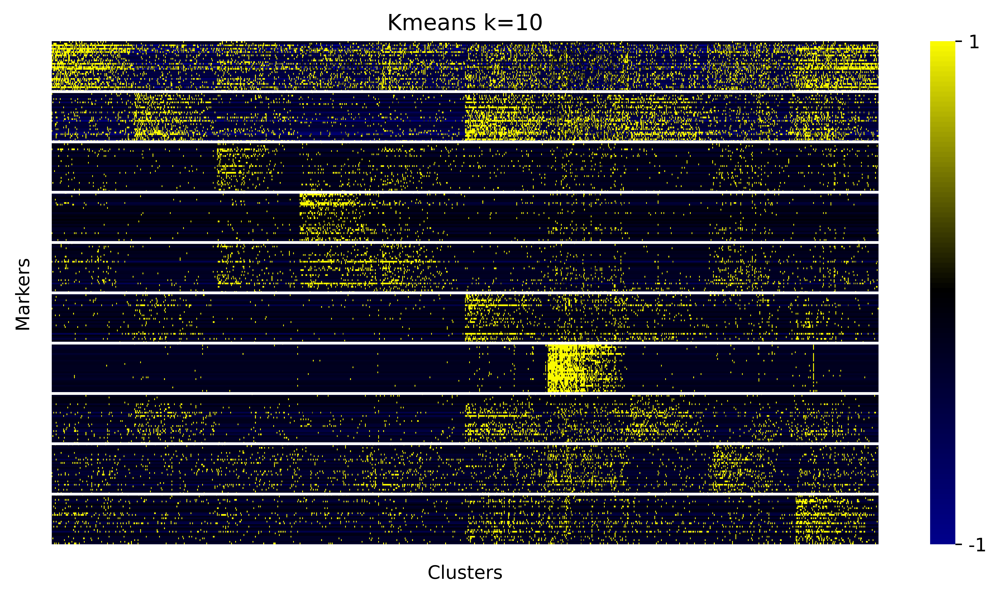

In [58]:
cells_indices = []
for cls_idx, cluster_indices in enumerate(clusters_indices):
    print(f'{cls_idx}. num cells: {len(cluster_indices)}', end='\t')
    top_markers_indices = mapping_clusters_to_marker_indices[cls_idx]
    mean_values = filtered_cells.counts[cluster_indices][:, top_markers_indices].mean(axis=1)
#     cluster_indices = np.array(cluster_indices)[np.flip(np.argsort(mean_values))].tolist()
    cluster_cells_order = np.flip(np.argsort(mean_values))
    cluster_indices = np.array(cluster_indices)[cluster_cells_order]
    sample_indices = sorted(random.sample(range(len(cluster_indices)), min(100, len(cluster_indices))))
    cluster_indices = cluster_indices[sample_indices].tolist()

    cells_indices += cluster_indices
    print(f' num cells: {len(cluster_indices)}')
    cell_vertical_lines += [cell_vertical_lines[-1] + len(cluster_indices)]
    
arr_heatmap = filtered_cells.counts[cells_indices][:, gene_indices]
heatmap = np.zeros_like(arr_heatmap)
heatmap[arr_heatmap > 1] = 1

## 19.3.21 using zscore
arr_heatmap = scipy.stats.zscore(arr_heatmap, axis=0, ddof=1)

fig, ax = plt.subplots(1)
fig.set_size_inches(10, 5)

sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
cbar = sb_out.collections[0].colorbar
cbar.set_ticks([-1, 1])
cbar.set_ticklabels([-1, 1])
sb_out.set(xticklabels=[])
sb_out.set(yticklabels=[])
sb_out.tick_params(bottom=False, left=False)
for hor_line in gene_horiz_lines[1:-1]:
    ax.axhline(hor_line, color='white')

for ver_line in cell_vertical_lines[1:-1]:
    ax.axvline(ver_line, color='white')

ax.set_title(f"Kmeans k={K}");
ax.set_xlabel('Clusters');
ax.set_ylabel('Markers');

##### save heatmap

In [27]:
# OUTPUT_PATH = r'/storage/md_keren/shitay/outputs/clustering/summaries/26.6.21/heatmap.png'
OUTPUT_PATH = fr'/storage/md_keren/shitay/outputs/clustering/myeloid/summary/subcohort_1.1.22_run_1.1.22/heatmap_k_{K}_sample_of_cells.png'
fig.savefig(OUTPUT_PATH)

##### Save top 5 genes

In [13]:
# with open(join(OUTPUT_PATH, f'top_5_markers_K_{K}.txt'), 'w') as text_file:
#     for key in top_gene_markers.keys():
#         for gene in top_gene_markers[key]:
#             text_file.write(' ' + gene + '\n')
#         text_file.write('\n')

# Debug

In [49]:
import scanpy as sc

In [50]:
my_df = pd.DataFrame(filtered_cells.counts, columns=filtered_cells.gene_names)
my_df

,TSPAN6,TNMD,DPM1,SCYL3,C1orf112,FGR,CFH,FUCA2,GCLC,NFYA,...,RP11-465N4.5,RP11-126K1.9,RP4-671G15.2,RP11-225H22.7,RP11-731C17.2,RP4-621B10.8,RP11-114I8.4,RP11-180C16.1,AP000230.1,RP11-80H18.4
0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25810,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25811,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25812,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25813,0.0,0.0,0.0,0.0,0.0,2.432818,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [51]:
import scanpy as sc
import anndata
my_df = pd.DataFrame(filtered_cells.counts, columns=filtered_cells.gene_names)
data = anndata.AnnData(my_df)
sc.tl.pca(data)
sc.pp.neighbors(data)
sc.tl.tsne(data)

In [52]:
import anndata

In [53]:
data = anndata.AnnData(my_df)

/Local/md_keren/anaconda3/lib/python3.8/site-packages/anndata/_core/anndata.py:120: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [18]:
sc.tl.pca(data)

In [20]:
sc.pp.neighbors(data)

In [22]:
sc.tl.tsne(data)

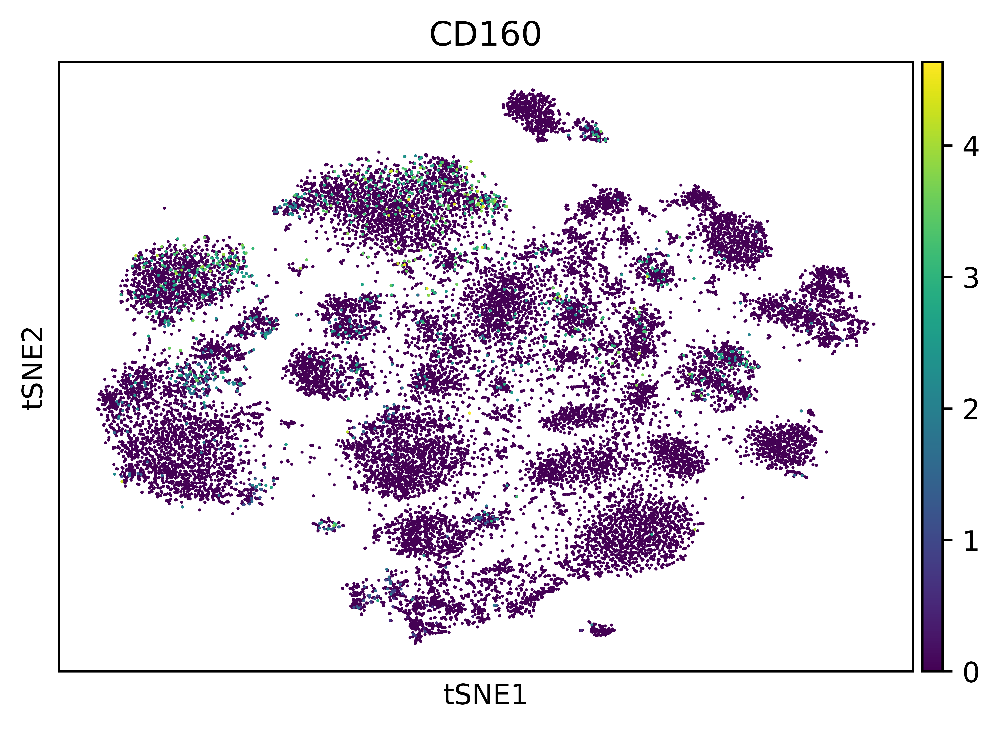

In [34]:
sc.pl.tsne(data, color = ['CD160'])

In [ ]:
def draw_heatmap(genes_for_heatmap, genes_by_clusters, cluster_num):
    my_lst = genes_for_heatmap + ['Cluster Out of 12']
    df = metabolic_genes_data[[c for c in metabolic_genes_data.columns if c in my_lst]]
    df = df.reindex(columns=(my_lst))
    df = df.sort_values(by = 'Cluster Out of 12').reset_index(drop = True)
    
    #look only on cells from the clusters with significant metabolic genes:
    df = df[df['Cluster Out of 12'].isin(genes_by_clusters)].reset_index(drop = True)

    #manipulation on columns:
    #for i in range(15):
        #df['Unnamed' + str(i)] = df['Cluster Out of 12']
    clusters_genes = genes_by_clusters + 1 * [None]
    
    #manipulation on rows:
    for i in range(16291, 16350):
        df.loc[i] = clusters_genes
    
    #transpose:
    df = df.transpose()
    
    #plot:
    plt.figure(figsize=(10,9))
    plt.title(f"Heatmap - Metabolic Genes - {cluster_num} Clusters - {set(genes_by_clusters)}", y = 1.05, size = 20)
    sns.heatmap(df, cmap = 'plasma', xticklabels=False, cbar = False)
    
    
def draw_heatmap_original(genes_for_heatmap, genes_by_clusters, cluster_num):
    my_lst = genes_for_heatmap + ['Cluster Out of 12']
    df = metabolic_genes_data[[c for c in metabolic_genes_data.columns if c in my_lst]]
    df = df.reindex(columns=(my_lst))
    df = df.sort_values(by = 'Cluster Out of 12').reset_index(drop = True)
    
    #look only on cells from the clusters with significant metabolic genes:
    df = df[df['Cluster Out of 12'].isin(genes_by_clusters)].reset_index(drop = True)

    #manipulation on columns:
    #for i in range(15):
        #df['Unnamed' + str(i)] = df['Cluster Out of 12']
    clusters_genes = genes_by_clusters + 1 * [None]
    
    #manipulation on rows:
    for i in range(16291, 16350):
        df.loc[i] = clusters_genes
    
    #transpose:
    df = df.transpose()
    
    #plot:
    plt.figure(figsize=(10,9))
    plt.title(f"Heatmap - Metabolic Genes - {cluster_num} Clusters - {set(genes_by_clusters)}", y = 1.05, size = 20)
    sns.heatmap(df, cmap = 'plasma', xticklabels=False, cbar = False)

In [47]:
# dd
arr_heatmap.T.shape
values = arr_heatmap.T[:100, :20]
dd = pd.DataFrame(values, columns=range(values.shape[1]), index=range(values.shape[0]))
dd.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,4.468373,5.421225,-0.193534,-0.193534,-0.193534,-0.193534,-0.193534,3.695217,-0.193534,2.772276,4.937899,6.649414,-0.193534,4.711394,-0.193534,-0.193534,-0.193534,3.646519,5.474196,-0.193534
1,2.558778,3.155027,-0.358422,-0.358422,2.823076,3.224252,-0.358422,3.049255,3.975152,2.951966,3.912444,-0.358422,-0.358422,2.710849,3.335257,-0.358422,2.934530,2.044500,-0.358422,-0.358422
2,1.115993,0.916276,0.873882,1.388807,1.043067,1.234227,1.516782,1.586764,1.085110,1.470253,1.848771,1.062230,2.054681,1.691303,1.286357,0.921795,1.301254,1.633004,1.717480,1.483819
3,2.595911,3.097288,1.732689,-0.463959,2.819981,3.154620,2.436109,1.421264,2.068537,1.652157,2.844806,-0.463959,-0.463959,-0.463959,-0.463959,3.619965,4.077187,1.397655,4.008320,2.122203
4,1.621688,1.648952,1.528918,1.552451,1.498709,1.873608,1.750727,1.209602,1.370774,1.671605,1.344487,1.651534,0.784144,1.912782,1.728883,1.261644,1.381670,1.368285,1.584646,1.640852


<AxesSubplot:title={'center':'Heatmap - Metabolic Genes - 12 Clusters - '}>

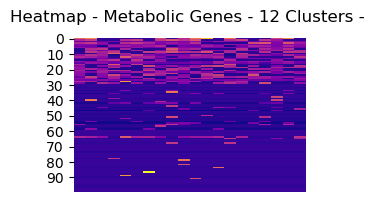

In [48]:
#plot:
# plt.rcdefaults()  # reset params
plt.figure(figsize=(3,2))
plt.title(f"Heatmap - Metabolic Genes - {12} Clusters - ", y = 1.05)#, size = 2)
sns.heatmap(dd, cmap = 'plasma', xticklabels=False, cbar = False)

In [49]:
import scanpy

ModuleNotFoundError: No module named 'scanpy'

In [ ]:
# fig, ax = plt.pyplot.subplots(1)
# fig.set_size_inches(10, 5)

# sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
# cbar = sb_out.collections[0].colorbar
# cbar.set_ticks([-1, 1])
# cbar.set_ticklabels([-1, 1])
# sb_out.set(xticklabels=[])
# sb_out.set(yticklabels=[])
# sb_out.tick_params(bottom=False, left=False)
# for hor_line in gene_horiz_lines[1:-1]:
#     ax.axhline(hor_line, color='white')

# for ver_line in cell_vertical_lines[1:-1]:
#     ax.axvline(ver_line, color='white')

# ax.set_title(f"Kmeans k={K}");
# ax.set_xlabel('Clusters');
# ax.set_ylabel('Markers');

In [36]:
cells_indices = []
for cls_idx, cluster_indices in enumerate(clusters_indices):
    print(f'{cls_idx}. num cells: {len(cluster_indices)}', end='\t')
    top_markers_indices = mapping_clusters_to_marker_indices[cls_idx]
    mean_values = filtered_cells.counts[cluster_indices][:, top_markers_indices].mean(axis=1)
#     cluster_indices = np.array(cluster_indices)[np.flip(np.argsort(mean_values))].tolist()
    cluster_cells_order = np.flip(np.argsort(mean_values))
    cluster_indices = np.array(cluster_indices)[cluster_cells_order]
    sample_indices = sorted(random.sample(range(len(cluster_indices)), min(100, len(cluster_indices))))
    cluster_indices = cluster_indices[sample_indices].tolist()

    cells_indices += cluster_indices
    print(f' num cells: {len(cluster_indices)}')
    cell_vertical_lines += [cell_vertical_lines[-1] + len(cluster_indices)]

0. num cells: 1660	 num cells: 100
1. num cells: 866	 num cells: 100
2. num cells: 503	 num cells: 100
3. num cells: 1553	 num cells: 100
4. num cells: 1601	 num cells: 100
5. num cells: 1341	 num cells: 100
6. num cells: 79	 num cells: 79
7. num cells: 1432	 num cells: 100
8. num cells: 1420	 num cells: 100
9. num cells: 1409	 num cells: 100
10. num cells: 1060	 num cells: 100


In [37]:
arr_heatmap = filtered_cells.counts[cells_indices][:, gene_indices]
heatmap = np.zeros_like(arr_heatmap)
heatmap[arr_heatmap > 1] = 1

## 19.3.21 using zscore
arr_heatmap = scipy.stats.zscore(arr_heatmap, axis=0, ddof=1)

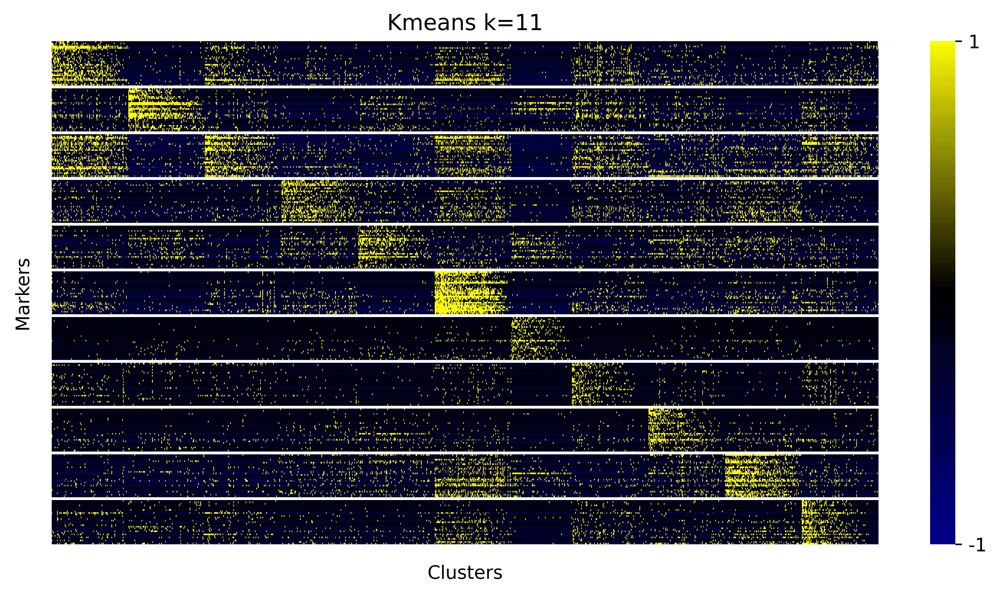

In [38]:
fig, ax = plt.pyplot.subplots(1)
fig.set_size_inches(10, 5)

sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
cbar = sb_out.collections[0].colorbar
cbar.set_ticks([-1, 1])
cbar.set_ticklabels([-1, 1])
sb_out.set(xticklabels=[])
sb_out.set(yticklabels=[])
sb_out.tick_params(bottom=False, left=False)
for hor_line in gene_horiz_lines[1:-1]:
    ax.axhline(hor_line, color='white')

for ver_line in cell_vertical_lines[1:-1]:
    ax.axvline(ver_line, color='white')

ax.set_title(f"Kmeans k={K}");
ax.set_xlabel('Clusters');
ax.set_ylabel('Markers');

In [32]:
cluster_cells_order = np.flip(np.argsort(mean_values))
cluster_indices = np.array(cluster_indices)[cluster_cells_order]
sample_indices = sorted(random.sample(range(len(cluster_indices)), min(100, len(cluster_indices))))
cluster_indices = cluster_indices[sample_indices].tolist()
cluster_indices

[1006,
 4564,
 10631,
 4130,
 6600,
 3982,
 3538,
 6004,
 4062,
 3829,
 12312,
 3778,
 1420,
 4252,
 6144,
 4357,
 10217,
 10289,
 3960,
 11977,
 1013,
 4547,
 12731,
 5752,
 4145,
 8743,
 4764,
 7287,
 5107,
 4040,
 1551,
 7215,
 5116,
 4216,
 4347,
 4136,
 3990,
 12452,
 7779,
 12454,
 9309,
 11932,
 4108,
 1279,
 3905,
 3586,
 11889,
 10709,
 6380,
 1321,
 4297,
 3597,
 4273,
 1097,
 4232,
 11965,
 3608,
 3781,
 12546,
 11709,
 3962,
 12567,
 12742,
 1479,
 4277,
 12030,
 4348,
 3809,
 12723,
 4323,
 3755,
 4196,
 4164,
 3907,
 3523,
 4074,
 12703,
 4205,
 5204,
 12373,
 3861,
 12565,
 4267,
 12517,
 1070,
 1448,
 11954,
 12400,
 6321,
 11183,
 3859,
 12679,
 11958,
 4843,
 3632,
 5178,
 12871,
 4284,
 3878,
 3896]

In [29]:
import random
sorted(random.sample(range(2), 2))

[0, 1]

In [17]:
[len(v) for v in clusters_indices]

[15181,
 2,
 4537,
 3385,
 2950,
 3,
 12924,
 10061,
 1,
 4726,
 10521,
 6522,
 1,
 3341,
 5345]

In [23]:
clustering_analysis[3]['markers']

,features,gene names,(1)mean_expression,(2)mean expression,log_FC,(1)#expressing,(2)#expressing,(1)%expressing,(2)%expressing,%expressing_diff,pvals
14159,ENSG00000177494,ZBED2,0.531377,0.041043,3.406848,652,1292,0.192614,0.016974,0.175640,0.000000e+00
659,ENSG00000049249,TNFRSF9,0.932133,0.107418,3.004281,1128,3343,0.333235,0.043920,0.289314,0.000000e+00
10761,ENSG00000162692,VCAM1,0.661805,0.092701,2.709589,773,2716,0.228360,0.035683,0.192678,0.000000e+00
9928,ENSG00000156234,CXCL13,3.330704,0.513895,2.672802,2275,8917,0.672083,0.117152,0.554931,0.000000e+00
5113,ENSG00000121039,RDH10,0.336549,0.046004,2.629447,445,1512,0.131462,0.019865,0.111598,4.903394e-194
...,...,...,...,...,...,...,...,...,...,...,...
7257,ENSG00000136490,LIMD2,2.610457,2.016927,0.370524,2581,50202,0.762482,0.659555,0.102927,3.278793e-37
3921,ENSG00000111678,C12orf57,2.271897,1.760365,0.366187,2346,45101,0.693058,0.592538,0.100520,2.493969e-32
18389,ENSG00000213402,PTPRCAP,3.537146,2.754634,0.359570,2979,55626,0.880059,0.730815,0.149244,6.019080e-96
21491,ENSG00000231389,HLA-DPA1,2.179776,1.762846,0.304716,2227,38670,0.657903,0.508047,0.149855,2.711611e-66


##### remove clusters 2,6,9,13 (index starts from 1, else substract 1)
##### changes markers of cluster 15 (index starts from 1, else substract 1)

In [45]:
kmeans_file_path = join(KMEANS_ROW_CLUSTERS_PATH, KMEANS_FILE_NAME + f'_k_{K}.pkl')
# print(f'Loading kmeans file:\n{kmeans_file_path}')
clusters_indices = pickle.load(open(kmeans_file_path, 'rb'))['clusters']
# markers
# clustering_analysis = pickle.load(open(join(CLUSTERING_ANALYSIS_PATH, f'cluster_analysis_k_{K}.pkl'), 'rb'))
[len(v) for v in clusters_indices]

[15181,
 2,
 4537,
 3385,
 2950,
 3,
 12924,
 10061,
 1,
 4726,
 10521,
 6522,
 1,
 3341,
 5345]

In [46]:
cluster_should_be_removed = [2, 6, 9, 13]
for cluster_idx in reversed(cluster_should_be_removed):
    del clusters_indices[cluster_idx-1]
[len(v) for v in clusters_indices]

[15181, 4537, 3385, 2950, 12924, 10061, 4726, 10521, 6522, 3341, 5345]

In [53]:
[len(v['markers']) for v in clustering_analysis]

[93, 0, 1445, 154, 178, 3, 1346, 74, 0, 252, 228, 37, 1, 1757, 17]

In [56]:
for cluster_idx in reversed(cluster_should_be_removed):
    del clustering_analysis[cluster_idx-1]
[len(v['markers']) for v in clustering_analysis]

[93, 1445, 154, 178, 1346, 74, 252, 228, 37, 1757, 17]

In [ ]:
cluster_should_be_removed = [2, 6, 9, 13]
for cluster_idx in reversed(cluster_should_be_removed):
    del clusters_indices[cluster_idx-1]
for cluster_idx in reversed(cluster_should_be_removed):
    del clustering_analysis[cluster_idx-1]
    
k15_cls_15_markers_path = r'/storage/md_keren/shitay/Data/tables/kmeans_clusters_markers_26.6.21/kmeans_26.6.21_k15_cls15_top30_markers.csv'
clustering_analysis[10]['markers'] = pd.read_csv(k15_cls_15_markers_path)

In [84]:
clustering_analysis[2]['markers']

,features,gene names,(1)mean_expression,(2)mean expression,log_FC,(1)#expressing,(2)#expressing,(1)%expressing,(2)%expressing,%expressing_diff,pvals
14159,ENSG00000177494,ZBED2,0.531377,0.041043,3.406848,652,1292,0.192614,0.016974,0.175640,0.000000e+00
659,ENSG00000049249,TNFRSF9,0.932133,0.107418,3.004281,1128,3343,0.333235,0.043920,0.289314,0.000000e+00
10761,ENSG00000162692,VCAM1,0.661805,0.092701,2.709589,773,2716,0.228360,0.035683,0.192678,0.000000e+00
9928,ENSG00000156234,CXCL13,3.330704,0.513895,2.672802,2275,8917,0.672083,0.117152,0.554931,0.000000e+00
5113,ENSG00000121039,RDH10,0.336549,0.046004,2.629447,445,1512,0.131462,0.019865,0.111598,4.903394e-194
...,...,...,...,...,...,...,...,...,...,...,...
7257,ENSG00000136490,LIMD2,2.610457,2.016927,0.370524,2581,50202,0.762482,0.659555,0.102927,3.278793e-37
3921,ENSG00000111678,C12orf57,2.271897,1.760365,0.366187,2346,45101,0.693058,0.592538,0.100520,2.493969e-32
18389,ENSG00000213402,PTPRCAP,3.537146,2.754634,0.359570,2979,55626,0.880059,0.730815,0.149244,6.019080e-96
21491,ENSG00000231389,HLA-DPA1,2.179776,1.762846,0.304716,2227,38670,0.657903,0.508047,0.149855,2.711611e-66


Changes order of DFS

dict_keys(['cluster id', 'markers'])
num markers for each cluster:  30
num markers for all clusters:  330
num clusters:  11
Num of repetition in markers: 268



(1)mean_expression

(1)mean_expression
dict_keys(['cluster id', 'markers'])


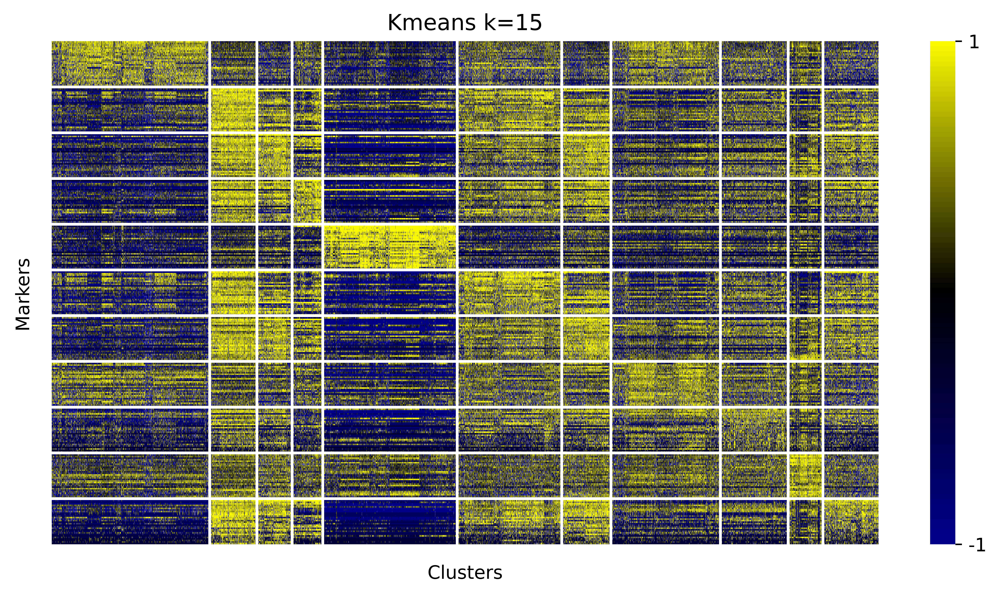

(1)%expressing

(1)%expressing
dict_keys(['cluster id', 'markers'])


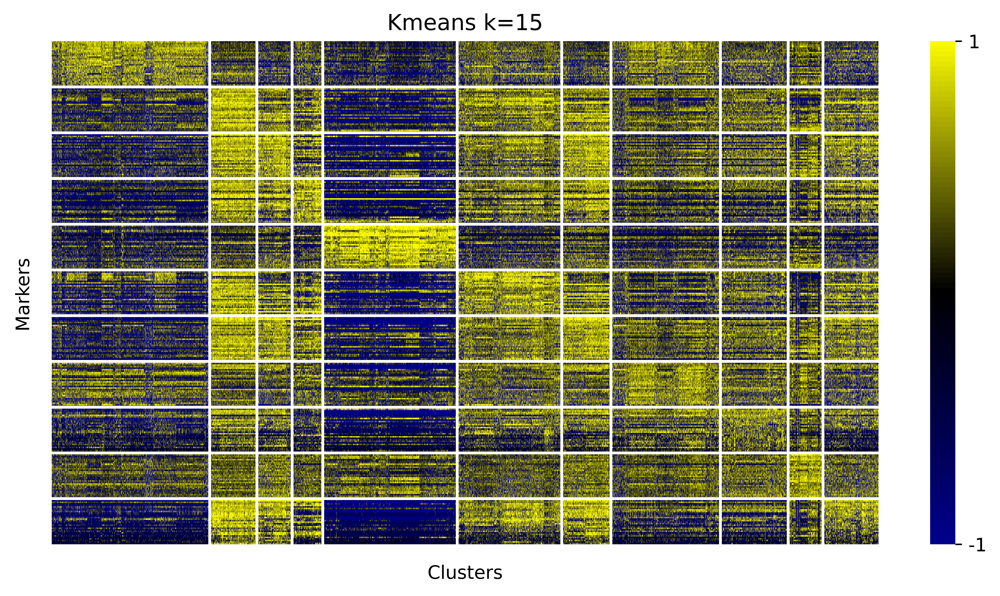

Orderd by %expressing_diff:

%expressing_diff
dict_keys(['cluster id', 'markers'])


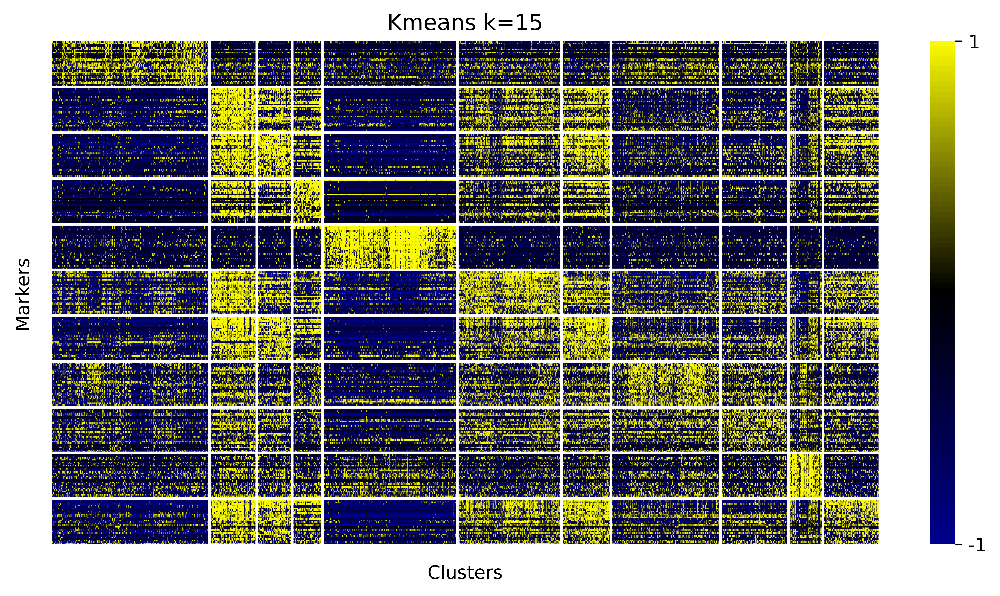

Orderd by logFC:

log_FC
dict_keys(['cluster id', 'markers'])


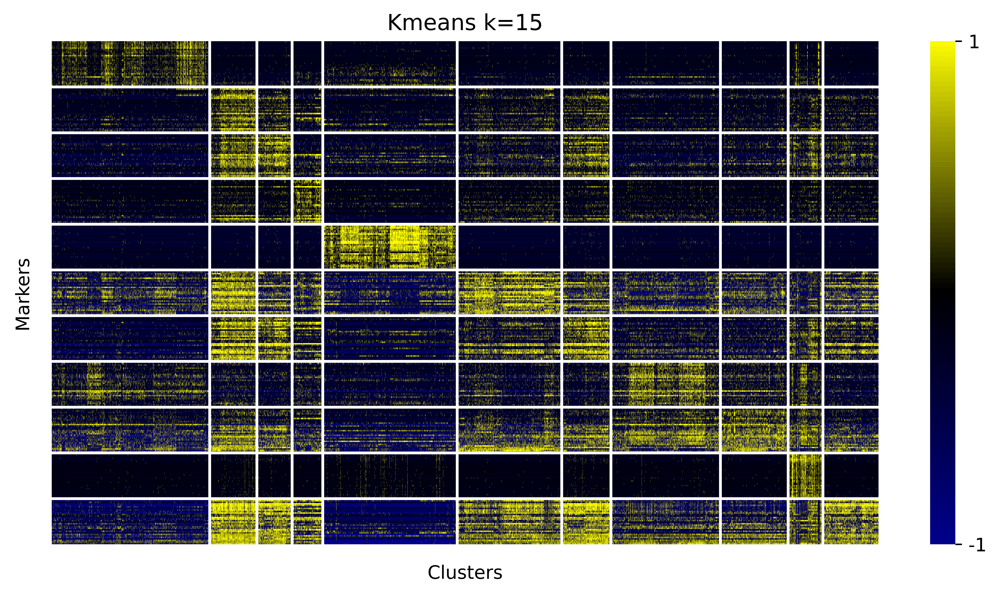

In [ ]:
by =  'log_FC'

print(by)
features = filtered_cells.features

print(clustering_analysis[0].keys())
gene_indices = []
gene_horiz_lines = [0]  # for heatmap
cell_vertical_lines = [0]  # for heatmap
top_gene_markers = {}


for cluster_dic in clustering_analysis:
    cluster_idx = cluster_dic['cluster id']
    cluster = cluster_dic['markers']

    cluster = cluster.sort_values(by=[by], ascending=False)
    gene_ids = cluster['features'].tolist()
    top_gene_markers[cluster_idx] = cluster['gene names'][:5]
    gene_indices += [features.index(ii) for ii in gene_ids[:NUM_OF_MARKER_GENES]]
    gene_horiz_lines += [gene_horiz_lines[-1] + len(gene_ids[:NUM_OF_MARKER_GENES])]



cells_indices = []
for cls_idx, cluster_indices in enumerate(clusters_indices):
    cells_indices += cluster_indices
    cell_vertical_lines += [cell_vertical_lines[-1] + len(cluster_indices)]
arr_heatmap = filtered_cells.counts[cells_indices][:, gene_indices]
heatmap = np.zeros_like(arr_heatmap)
heatmap[arr_heatmap > 1] = 1

## 19.3.21 using zscore
arr_heatmap = scipy.stats.zscore(arr_heatmap, axis=0, ddof=1)

fig, ax = plt.pyplot.subplots(1)
fig.set_size_inches(10, 5)

sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
cbar = sb_out.collections[0].colorbar
cbar.set_ticks([-1, 1])
cbar.set_ticklabels([-1, 1])
sb_out.set(xticklabels=[])
sb_out.set(yticklabels=[])
sb_out.tick_params(bottom=False, left=False)
for hor_line in gene_horiz_lines[1:-1]:
    ax.axhline(hor_line, color='white')

for ver_line in cell_vertical_lines[1:-1]:
    ax.axvline(ver_line, color='white')

ax.set_title(f"Kmeans k={K}");
ax.set_xlabel('Clusters');
ax.set_ylabel('Markers');

In [103]:

PROTEIN_CODING_FILE = r'/storage/md_keren/shitay/Data/tables/gene_ens_map.xlsx'
df = pandas.read_excel(PROTEIN_CODING_FILE, header = None, names=['gene_id', 'gene', '1', '2'])
protein_coding_genes = df[df['2'] == 'protein_coding']['gene'].tolist()

In [102]:
len(filtered_cells.gene_names)

32738

In [113]:
# proteing_coding_genes

In [114]:
protein_coding_gene_indices = [idx for idx, g in enumerate(filtered_cells.gene_names) if g in protein_coding_genes]

In [116]:
len(protein_coding_gene_indices)

20273

In [12]:
# 25.7.21

In [21]:
by =  'log_FC'

print(by)
features = filtered_cells.features

print(clustering_analysis[0].keys())
gene_indices = []
gene_horiz_lines = [0]  # for heatmap
cell_vertical_lines = [0]  # for heatmap
top_gene_markers = {}


log_FC
dict_keys(['cluster id', 'markers'])


In [22]:
mapping_clusters_to_marker_indices = {}
for idx, cluster_dic in enumerate(clustering_analysis):
    cluster_idx = cluster_dic['cluster id']
    cluster = cluster_dic['markers']
    print(cluster_idx)
    cluster = cluster.sort_values(by=[by], ascending=False)
    gene_ids = cluster['features'].tolist()
#     top_gene_markers[cluster_idx] = cluster['gene names'][:5]
    top_markers_indices = [features.index(ii) for ii in gene_ids[:NUM_OF_MARKER_GENES]]
    mapping_clusters_to_marker_indices[idx] = top_markers_indices
    gene_indices += top_markers_indices
    gene_horiz_lines += [gene_horiz_lines[-1] + len(gene_ids[:NUM_OF_MARKER_GENES])]


0
2
3
4
6
7
9
10
11
13
14


In [47]:
# filtered_cells.counts[cluster_indices][:, gene_indices].shape
# me = filtered_cells.counts[cluster_indices][:, gene_indices].mean(axis=1)
# list(reversed(me[np.argsort(me)]))
np.flip(np.argsort(me))

array([2606, 4261,  995, ..., 1359,  111, 4856])

In [50]:
cells_indices = []
for cls_idx, cluster_indices in enumerate(clusters_indices):
    print(cls_idx)
    top_markers_indices = mapping_clusters_to_marker_indices[cls_idx]
    mean_values = filtered_cells.counts[cluster_indices][:, top_markers_indices].mean(axis=1)
    cells_indices += np.array(cluster_indices)[np.flip(np.argsort(mean_values))].tolist()
    cell_vertical_lines += [cell_vertical_lines[-1] + len(cluster_indices)]
#     print(mapping_clusters_to_marker_indices[cls_idx])

0
1
2
3
4
5
6
7
8
9
10


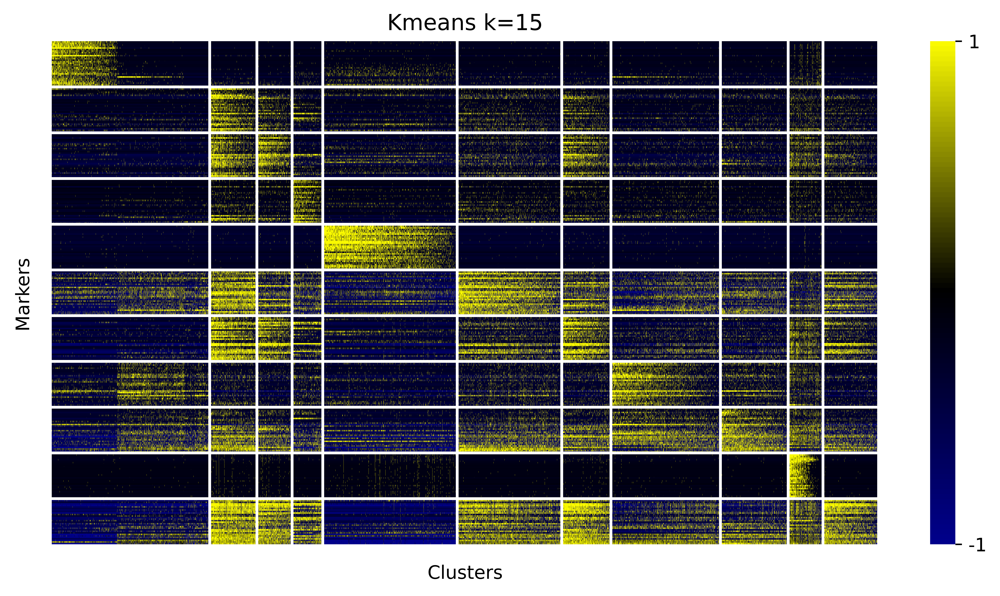

In [51]:
arr_heatmap = filtered_cells.counts[cells_indices][:, gene_indices]
heatmap = np.zeros_like(arr_heatmap)
heatmap[arr_heatmap > 1] = 1

## 19.3.21 using zscore
arr_heatmap = scipy.stats.zscore(arr_heatmap, axis=0, ddof=1)

fig, ax = plt.pyplot.subplots(1)
fig.set_size_inches(10, 5)

sb_out = sb.heatmap(arr_heatmap.T, vmin=-1, vmax=1, cmap=cmap);
cbar = sb_out.collections[0].colorbar
cbar.set_ticks([-1, 1])
cbar.set_ticklabels([-1, 1])
sb_out.set(xticklabels=[])
sb_out.set(yticklabels=[])
sb_out.tick_params(bottom=False, left=False)
for hor_line in gene_horiz_lines[1:-1]:
    ax.axhline(hor_line, color='white')

for ver_line in cell_vertical_lines[1:-1]:
    ax.axvline(ver_line, color='white')

ax.set_title(f"Kmeans k={K}");
ax.set_xlabel('Clusters');
ax.set_ylabel('Markers');

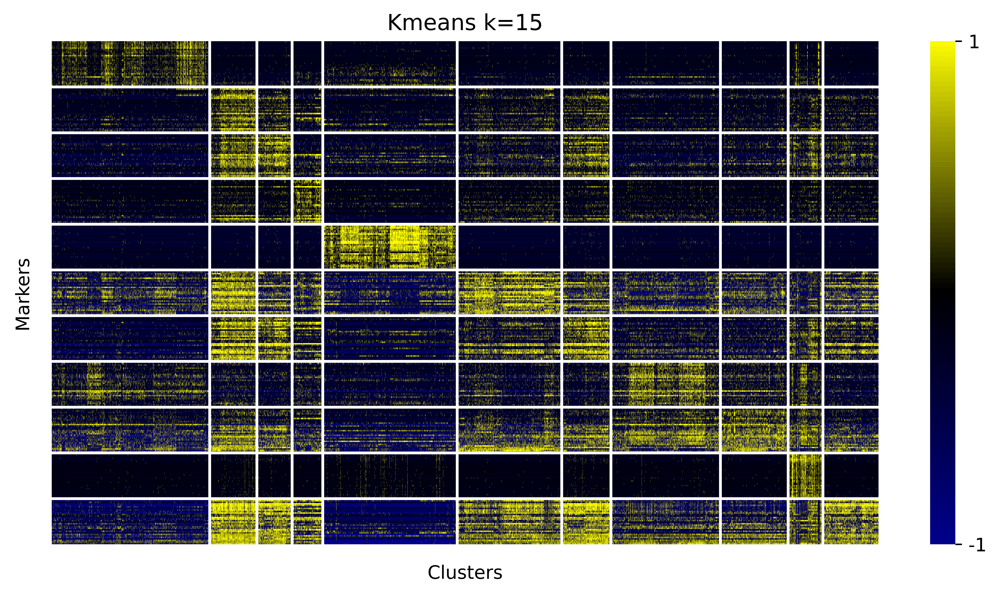

In [61]:
hor_line

300